# Introduction Of The Task. 

In this task, the objective is to build a collaborative filtering recommender system using Apache Spark’s MLlib to generate personalized recommendations based on user behavior data. The dataset is first loaded into a Spark DataFrame, followed by an initial exploratory analysis to gain insights into user interactions and item popularity. The recommendation model is trained using the Alternating Least Squares (ALS) algorithm, a widely-used technique for collaborative filtering. Prior to training, necessary data preprocessing steps are performed, including handling missing values and splitting the data into training and test sets for evaluation. The model's performance is then assessed, and the resulting recommendations are analyzed to understand its effectiveness. The analysis also considers whether to include both 'purchase' and 'play' behaviors, or to focus on one for a more targeted approach.



My Approach:
After loading the data into a dataframe i have preprocessed it for columns like Member_ID and Game_name, Game_Name need to be converted to integer in order for the ALS to process it correctly and for the Member_ID the values were iteger but they were not i

# Data Loading

For the first step we have loaded the csv file into a variable named steam_200k_dataframe on hich we will be next performing the preprocessing steps. 

In [0]:
steam_200k_dataframe = spark.read.csv(
"/FileStore/tables/steam_200k.csv",
header=True, # Use the first row as the header
inferSchema=True, # Infer data types
quote='"', # Define the quote character
escape='"', # Escape quotes inside quoted fields
multiLine=True # Enable multiline support
)
# New column names based on the provided description
new_column_names = ["Member_ID", "Game_Name", "Behavior", "Value"]

# Assign the new column names to the DataFrame
steam_200k_dataframe = steam_200k_dataframe.toDF(*new_column_names)

# Sort by user_int (row-wise sorting)
steam_200k_dataframe = steam_200k_dataframe.orderBy("Member_ID")
# Display the DataFrame with updated column names
display(steam_200k_dataframe)


Member_ID,Game_Name,Behavior,Value
5250,Cities Skylines,purchase,1.0
5250,Cities Skylines,play,144.0
5250,Deus Ex Human Revolution,purchase,1.0
5250,Deus Ex Human Revolution,play,62.0
5250,Portal 2,purchase,1.0
5250,Portal 2,play,13.6
5250,Alien Swarm,purchase,1.0
5250,Alien Swarm,play,4.9
5250,Team Fortress 2,purchase,1.0
5250,Team Fortress 2,play,0.8


In [0]:
# Create a DataFrame with game_id and Game_Name
game_mapping_df = steam_200k_dataframe.select("Game_Name").distinct()

# You can add a "game_id" column if needed. For example, if game IDs are consecutive integers, you can use a monotonically increasing id for mapping:
from pyspark.sql.functions import monotonically_increasing_id

game_mapping_df = game_mapping_df.withColumn("game_id", monotonically_increasing_id())

# Show the DataFrame to verify
display(game_mapping_df)


Game_Name,game_id
Dota 2,0
METAL GEAR SOLID V THE PHANTOM PAIN,1
LEGO Batman The Videogame,2
RIFT,3
Anodyne,4
Legend of Grimrock,5
Divinity Original Sin,6
Meltdown,7
SanctuaryRPG Black Edition,8
Snuggle Truck,9


# Exploratory Data Analysis

Before proceeding with data visualization or model development, we will be performing some basic exploratory data analysis (EDA). This step provides a deeper understanding of the dataset’s structure, content, and potential issues such as missing values or data imbalance. By examining schema details, summary statistics, and the distribution of user behaviors, we can make informed decisions about data preprocessing and model selection. Understanding the most active users and the most interacted-with games also helps uncover patterns that can enhance the effectiveness of the recommendation system.

In [0]:
from pyspark.sql.functions import col, countDistinct, count, sum

# 1. Print Schema
print("=== [1] Dataset Schema ===")
print("This shows the structure of the dataset, including column names and inferred data types.\n")
steam_200k_dataframe.printSchema()

# 2. Summary Statistics
print("\n=== [2] Summary Statistics ===")
print("Provides count, mean, standard deviation, min, and max for numeric columns like 'Value'.\n")
steam_200k_dataframe.describe().show()

# 3. Check for Null or Missing Values
print("\n=== [3] Null Value Check ===")
print("Checks if any column contains null values, which could affect model training.\n")
steam_200k_dataframe.select(
    [col(c).isNull().alias(c) for c in steam_200k_dataframe.columns]
).groupBy().sum().show()

# 4. Count of Unique Entries
print("\n=== [4] Unique Users, Games, and Behaviors ===")
print("Gives an idea of dataset scale: how many users, games, and types of user actions (e.g. 'purchase', 'play') are recorded.\n")
steam_200k_dataframe.select(
    countDistinct("Member_ID").alias("Unique Users"),
    countDistinct("Game_Name").alias("Unique Games"),
    countDistinct("Behavior").alias("Behavior Types")
).show()

# 5. Behavior Distribution
print("\n=== [5] Behavior Type Distribution ===")
print("Displays how many interactions are 'purchase' vs 'play' – helps decide which behavior to use for modeling.\n")
steam_200k_dataframe.groupBy("Behavior").count().orderBy("count", ascending=False).show()

# 6. Most Active Users
print("\n=== [6] Top 5 Most Active Users ===")
print("Identifies users with the highest number of interactions, which could influence recommendations.\n")
steam_200k_dataframe.groupBy("Member_ID").agg(
    count("*").alias("Activity Count")
).orderBy("Activity Count", ascending=False).show(5)

# 7. Top Games by Total Value
print("\n=== [7] Top 5 Games by Total Value (Playtime or Purchase) ===")
print("Highlights the most popular games based on cumulative hours played or money spent.\n")
steam_200k_dataframe.groupBy("Game_Name", "Behavior").agg(
    sum("Value").alias("Total Value")
).orderBy("Total Value", ascending=False).show(5)


=== [1] Dataset Schema ===
This shows the structure of the dataset, including column names and inferred data types.

root
 |-- Member_ID: integer (nullable = true)
 |-- Game_Name: string (nullable = true)
 |-- Behavior: string (nullable = true)
 |-- Value: double (nullable = true)


=== [2] Summary Statistics ===
Provides count, mean, standard deviation, min, and max for numeric columns like 'Value'.

+-------+--------------------+----------------+--------+------------------+
|summary|           Member_ID|       Game_Name|Behavior|             Value|
+-------+--------------------+----------------+--------+------------------+
|  count|              199999|          199999|  199999|            199999|
|   mean|1.0365562620621103E8|           140.0|    null|17.874468372341752|
| stddev|  7.20808355946761E7|             0.0|    null| 138.0572916399098|
|    min|                5250|     007 Legends|    play|               0.1|
|    max|           309903146|theHunter Primal|purchase|       

In [0]:
%python
!pip install matplotlib
!pip install seaborn
!pip install pandas

You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-6144df90-0334-462b-8094-f22eec7649cf/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-6144df90-0334-462b-8094-f22eec7649cf/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-6144df90-0334-462b-8094-f22eec7649cf/bin/python -m pip install --upgrade pip' command.


# Visualizing User Behavior Distribution
To gain a clearer understanding of user interaction patterns in the dataset, we visualized the distribution of behavior types specifically purchase and play actions. This bar chart highlights the frequency of each behavior, helping to assess the overall engagement level across the platform. Understanding this distribution is crucial for making informed modeling choices. Since both types of behavior offer valuable insights—purchase indicating interest and play reflecting actual engagement—we chose to incorporate both in our collaborative filtering model. This inclusive approach aims to enhance recommendation accuracy by capturing a more comprehensive picture of user preferences.

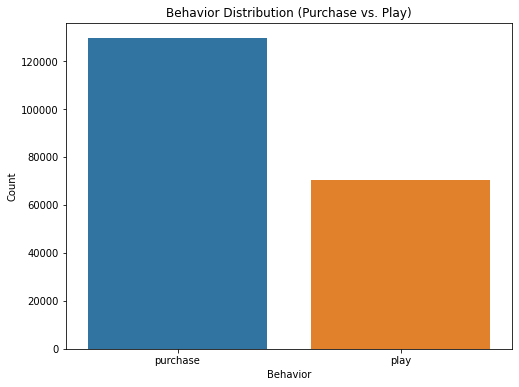

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
# Convert Spark DataFrame to Pandas DataFrame
pandas_df = steam_200k_dataframe.toPandas()

# Plot a bar chart showing the distribution of behaviors (purchase vs. play)
plt.figure(figsize=(8, 6))
sns.countplot(data=pandas_df, x='Behavior')
plt.title('Behavior Distribution (Purchase vs. Play)')
plt.xlabel('Behavior')
plt.ylabel('Count')
plt.show()


## Top 10 Most Purchased Games
To better understand which games are the most popular in terms of purchases, we filtered the dataset to include only rows where the behavior was 'purchase'. We then grouped the data by game name and counted how many times each game was purchased. After sorting the results, we selected the top 10 games with the highest number of purchases. The bar chart below shows these top 10 games. This helps us see which games users are most willing to buy, which can be useful for building more relevant recommendations or understanding user interest from a sales point of view.

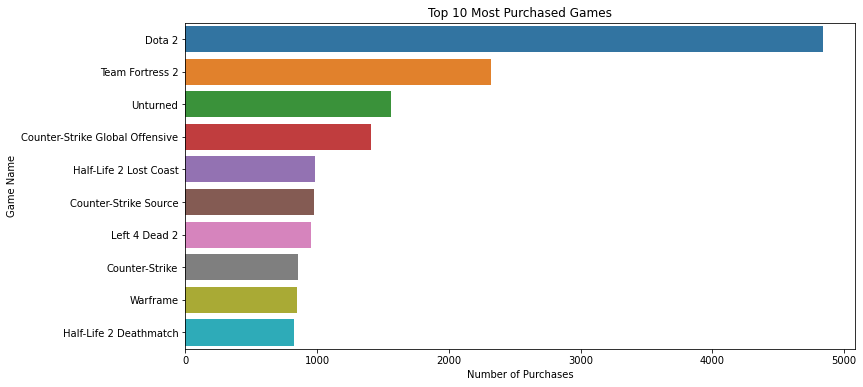

In [0]:
# Filter for 'purchase' behavior and group by game name
purchase_data = pandas_df[pandas_df['Behavior'] == 'purchase']
top_purchased_games = purchase_data.groupby('Game_Name')['Value'].count().reset_index()

# Sort by number of purchases and get the top 10
top_purchased_games_sorted = top_purchased_games.sort_values('Value', ascending=False).head(10)

# Plot the top 10 purchased games
plt.figure(figsize=(12, 6))
sns.barplot(x='Value', y='Game_Name', data=top_purchased_games_sorted)
plt.title('Top 10 Most Purchased Games')
plt.xlabel('Number of Purchases')
plt.ylabel('Game Name')
plt.show()


## Top 10 Most Played Games by Total Hours
In this step, we focused on the 'play' behavior to find out which games users spent the most time playing. We filtered the dataset to include only play-related entries and grouped the data by game name. Then, we summed up the total number of hours played for each game. After sorting the games by total playtime, we selected the top 10 and visualized them in a bar chart. This gives us a better understanding of user engagement—highlighting the games that users play the most, which can be useful for making time-based or interest-driven recommendations.

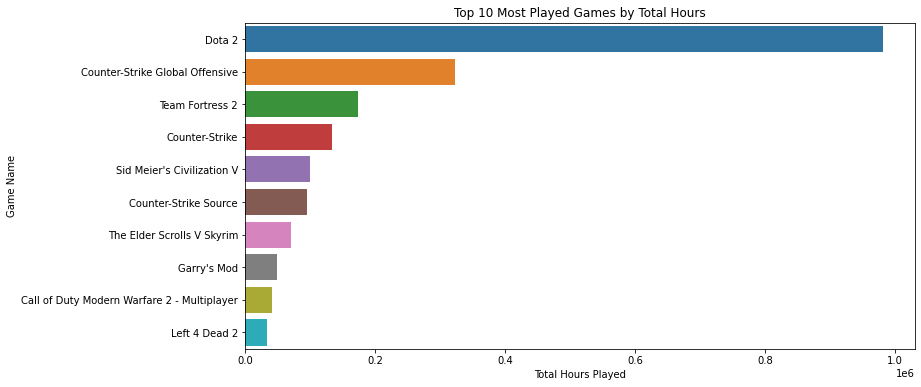

In [0]:
# Filter for 'play' behavior and group by game name
play_data = pandas_df[pandas_df['Behavior'] == 'play']
top_played_games = play_data.groupby('Game_Name')['Value'].sum().reset_index()

# Sort by total hours played and get the top 10
top_played_games_sorted = top_played_games.sort_values('Value', ascending=False).head(10)

# Plot the top 10 played games
plt.figure(figsize=(12, 6))
sns.barplot(x='Value', y='Game_Name', data=top_played_games_sorted)
plt.title('Top 10 Most Played Games by Total Hours')
plt.xlabel('Total Hours Played')
plt.ylabel('Game Name')
plt.show()


# Data Pre-Processing

### Preprocessing and Data Preparation for ALS

In this section, we performed a series of data preprocessing steps to prepare our dataset for the ALS model. The goal was to efficiently transform the data and ensure that the model can train effectively.

#### 1. **StringIndexer for Categorical Columns**

We began by applying the `StringIndexer` to the following columns:
- `Member_ID`: The user identifier, which was originally numeric.
- `Game_Name`: The game played by the user.
- `Behavior`: The type of interaction (in this case, "play").

Although `Member_ID` was already numeric, we used `StringIndexer` to **index** it. This was done because the values in `Member_ID` are **categorical identifiers** rather than continuous numbers. If we passed the raw numeric values to the ALS model, it would treat each unique ID as a separate entity. For example, a number like `84938411` would be seen as a new user, which could lead to **inefficient memory allocation**. By applying indexing, we map these values into **dense, zero-based indices**, which ensures that ALS handles them efficiently and without memory overhead.

We also applied `StringIndexer` to the `Game_Name` and `Behavior` columns, converting them into numerical indices, as ALS requires all input features to be numeric.

#### 2. **Using both play and purchase behaviour**

Here we have decided to work with both play and purchase behaviour because filtering out the play behaviour can lead to data loss efffecting the performance of the model. 

#### 3. **Grouping and Aggregating Data**

Next, we grouped the data by `user_int` (indexed user) and `game_int` (indexed game) and calculated the **sum of ratings** for each user-game pair. This is an essential step because ALS works with user-item interactions, and we need each user-game pair to have a single rating value. Aggregating the ratings ensures that we are capturing the total engagement of a user with a particular game.

#### 4. **Log Transformation**

To address the distribution of ratings, we applied the **log1p transformation** to the summed ratings. The log1p transformation (`log(1 + x)`) is useful because it normalizes the data and mitigates the impact of extreme values or outliers. This helps the model focus on the overall patterns of user preferences rather than being skewed by extreme ratings.

#### 5. **Rounding Transformed Ratings**

After the log transformation, we rounded the ratings to **one decimal place**. This step ensures consistency and helps simplify the dataset for the ALS algorithm, reducing potential noise that may arise from unnecessary decimal precision.

#### 6. **Final Data Preparation**

Finally, we prepared the data for ALS by selecting and renaming the relevant columns (`user_int` as `user`, `game_int` as `item`, and the transformed `rating`). This resulted in a clean dataset with the correct format required by the ALS model.

---

### Conclusion

Through this preprocessing pipeline, we ensured that our data was:
- Efficiently indexed to avoid memory issues.
- Focused on play and prchase behaviour.
- Normalized and aggregated to facilitate effective training.
- Ready for the ALS model with a well-structured and clean format.

By following these steps, we optimized the data for ALS, ensuring better model performance and memory efficiency.


In [0]:
from pyspark.sql.functions import sum, col, log1p, round
from pyspark.ml.feature import StringIndexer

# Encode categorical columns
user_indexer = StringIndexer(inputCol="Member_ID", outputCol="user_int", handleInvalid="skip")
game_indexer = StringIndexer(inputCol="Game_Name", outputCol="game_int", handleInvalid="skip")
behavior_indexer = StringIndexer(inputCol="Behavior", outputCol="behavior_int", handleInvalid="skip")

# Fit and transform the indexing
indexed_df = user_indexer.fit(steam_200k_dataframe).transform(steam_200k_dataframe)
indexed_df = game_indexer.fit(indexed_df).transform(indexed_df)
indexed_df = behavior_indexer.fit(indexed_df).transform(indexed_df)

# Select and cast columns for further processing
final_df = indexed_df.select(
    col("behavior_int").cast("int"),
    col("game_int").cast("int"),
    col("Value").alias("rating").cast("double"),
    col("user_int").cast("int")
)

# Group by user and game, sum ratings
grouped_df = final_df.groupBy("user_int", "game_int").agg(
    sum("rating").alias("rating")
)

# Log transform and rounding (if needed)
grouped_df = grouped_df.withColumn("rating", log1p(col("rating")))
grouped_df = grouped_df.withColumn("rating", round(col("rating"), 1))  # Optional rounding

# Prepare for ALS
Preprocessed_data_for_ALS = grouped_df.select(
    col("user_int").alias("user"),
    col("game_int").alias("item"),
    col("rating").alias("rating")
)

# Display the final DataFrame
display(Preprocessed_data_for_ALS)


user,item,rating
438,22,1.0
438,585,0.7
438,1142,0.7
40,442,2.5
40,167,0.9
40,1335,0.7
1102,520,0.7
135,47,1.6
135,145,0.7
20,121,3.0


## Using `.describe()` to derive the following insights about our dataset. 
The dataset includes 128,804 user–game ratings, giving us plenty of examples of player behavior. On average, games score 1.57, but with a spread (standard deviation) of 1.33, scores often fall much higher or lower. In fact, ratings go from 0.7 showing very little play to 9.4 reflecting games players really love. This wide range means our recommendation model can learn clear differences between games that are seldom played, those that are moderately enjoyed, and the ones users can’t get enough of.

In [0]:
# Check the statistics of the 'rating' (play hours) column
Preprocessed_data_for_ALS.select("rating").describe().show()


+-------+------------------+
|summary|            rating|
+-------+------------------+
|  count|            128804|
|   mean|1.5689264308572344|
| stddev|1.3286486013195369|
|    min|               0.7|
|    max|               9.4|
+-------+------------------+



## Splitting the Data into train and test set. 
<br>
In this part of the code, the dataset is split into two parts: a training set and a test set. The `randomSplit([0.8, 0.2], seed=42)` function divides the training_data DataFrame such that 80% of the data is used for training the model, while the remaining 20% is reserved for testing. The seed=42 ensures that the split is reproducible, meaning each time the code is run, the data will be split in the same way, this is important to evaluate the model on different metrics. This split is crucial because it allows us to train the ALS model on one portion of the data and then evaluate its performance on a separate, unseen portion, helping to assess how well the model generalizes to new data.

In [0]:
# Train test Split
# Split into training and test datasets
(train, test) = Preprocessed_data_for_ALS.randomSplit([0.8, 0.2], seed=42)


# Model Training

## ALS Model Training with PySpark

In this ALS model training setup, we specify key parameters tailored to our use case where the ratings represent transformed playtime data (scaled from hours played). We set userCol, itemCol, and ratingCol to define the structure of our data — identifying the user, the item (e.g., a game), and the rating (scaled engagement). The nonnegative=True parameter ensures the model produces only non-negative predictions, aligning with the nature of our input data, where negative ratings are not meaningful. We use coldStartStrategy="drop" to automatically exclude user-item pairs with missing factors during evaluation, preventing errors like NaN values. Most importantly, implicitPrefs=False is chosen because, although our ratings originated from implicit behavior (hours played), we transformed and treated them as explicit feedback — allowing the model to learn directly from these numerical ratings rather than interpreting them as confidence scores. Finally, als.fit(train) trains the model on our prepared dataset.


In [0]:
# ALS model training
from pyspark.ml.recommendation import ALS

als = ALS(
    userCol="user",
    itemCol="item",
    ratingCol="rating",
    nonnegative=True,
    coldStartStrategy="drop",
    implicitPrefs=False
)

als_model = als.fit(train)


# Model Evaluation

To evaluate the performance of the trained ALS model, we use the RegressionEvaluator from PySpark MLlib with the rmse `Root Mean Squared Error` metric. First, we apply the model to the test dataset using als_model.transform`test`, which generates predicted ratings in a new column named prediction. We then initialize the evaluator by specifying the actual rating column `labelCol="rating"` and the predicted rating column `predictionCol="prediction"`. Finally, we calculate the RMSE using evaluator.evaluate`predictions`. A lower RMSE value indicates that the model's predicted ratings are closer to the actual ratings, implying better recommendation accuracy.

In [0]:
# Model Evaluation
from pyspark.ml.evaluation import RegressionEvaluator

predictions = als_model.transform(test)

evaluator = RegressionEvaluator(metricName="rmse", labelCol="rating", predictionCol="prediction")
rmse = evaluator.evaluate(predictions)

print(f"RMSE: {rmse}")


# Hyperparameter Tuning And MLfLow Tracking

In this section, we perform hyperparameter tuning on the ALS (Alternating Least Squares) recommendation model and track the results using MLflow. Hyperparameter tuning helps us find the best combination of parameters, such as rank and regularization, to optimize model performance.

We define a grid for two key hyperparameters:

**Rank**: The number of latent factors (values: 5, 10, 15).

**Regularization Parameter (regParam)**: Controls overfitting (values: 0.001, 0.005, 0.01, 0.05, 0.1).

The training and evaluation are done in a loop for each combination, logging the hyperparameters, RMSE metric, and model artifacts in MLflow. The best model is tracked in memory, updating whenever a lower RMSE is found.

After testing all combinations, the best model, along with its hyperparameters and RMSE score, is displayed. MLflow ensures that all hyperparameters, metrics, and models are logged for reproducibility, enabling easy comparison and tracking of the most effective configuration.

In [0]:
from pyspark.ml.recommendation import ALS  # Importing the ALS algorithm for recommendation
from pyspark.ml.evaluation import RegressionEvaluator  # Importing RMSE evaluator
import mlflow  # Importing MLflow for tracking experiments
import mlflow.spark  # Importing MLflow Spark for saving models

# Define the parameter grid for hyperparameter tuning
ranks     = [5, 10, 15]  # Possible values for the rank parameter (number of latent factors)
regParams = [0.001, 0.005, 0.01, 0.05, 0.1]  # Possible values for the regularization parameter

# Initialize variables to store the best model information
best_model = None  # To store the best model
best_rmse  = float('inf')  # To track the lowest RMSE
best_rank  = None  # To store the best rank
best_reg   = None  # To store the best regularization parameter

# Create an evaluator instance to calculate RMSE (Root Mean Squared Error)
evaluator = RegressionEvaluator(metricName="rmse", labelCol="rating", predictionCol="prediction")

# Iterate over the defined hyperparameters (rank and regParam)
for rank in ranks:
    for reg in regParams:
        # Start a new MLflow run to track the current set of hyperparameters and the model training
        with mlflow.start_run():
            print(f"Training ALS model with rank={rank} and regParam={reg}...")
            
            # Log the hyperparameters to MLflow for tracking
            mlflow.log_param("rank", rank)  # Log the rank (number of latent factors)
            mlflow.log_param("regParam", reg)  # Log the regularization parameter
            mlflow.log_param("maxIter", 10)  # Log the number of iterations for ALS model training

            # Build and train the ALS model using the current hyperparameters
            als = ALS(
                userCol="user",  # Column name for user ID
                itemCol="item",  # Column name for item ID
                ratingCol="rating",  # Column name for ratings
                nonnegative=True,  # Ensure all predictions are non-negative
                coldStartStrategy="drop",  # Drop rows with NaN predictions
                implicitPrefs=False,  # Indicate whether we are working with implicit preferences
                rank=rank,  # Number of latent factors
                regParam=reg,  # Regularization parameter
                maxIter=10  # Maximum number of iterations for ALS
            )
            model = als.fit(train)  # Train the model on the training data

            # Evaluate the model using the test data
            predictions = model.transform(test)  # Make predictions on the test data
            rmse = evaluator.evaluate(predictions)  # Calculate RMSE
            print(f"RMSE = {rmse:.4f}")  # Print the RMSE for the current model

            # Log the RMSE metric to MLflow
            mlflow.log_metric("rmse", rmse)

            # Log the trained model as an artifact in MLflow
            mlflow.spark.log_model(model, artifact_path="als_model")

            # Track the best model based on RMSE (lowest RMSE is preferred)
            if rmse < best_rmse:
                best_rmse  = rmse  # Update best RMSE
                best_model = model  # Update best model
                best_rank  = rank  # Update best rank
                best_reg   = reg   # Update best regularization parameter

# Print a summary of the best model found during hyperparameter tuning
print("\n=== [Best Model Found] ===")
print(f"Best Rank: {best_rank}")  # Display the best rank found
print(f"Best Regularization Parameter (regParam): {best_reg}")  # Display the best regularization parameter
print(f"Best RMSE on Test Data: {best_rmse:.4f}")  # Display the best RMSE achieved


Training ALS model with rank=5 and regParam=0.001...
RMSE = 1.3624


2025/04/24 02:02:23 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


Training ALS model with rank=5 and regParam=0.005...
RMSE = 1.2038


2025/04/24 02:04:21 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


Training ALS model with rank=5 and regParam=0.01...
RMSE = 1.1799


2025/04/24 02:06:22 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


Training ALS model with rank=5 and regParam=0.05...
RMSE = 1.1226


2025/04/24 02:08:23 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


Training ALS model with rank=5 and regParam=0.1...
RMSE = 1.0872


2025/04/24 02:10:22 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


Training ALS model with rank=10 and regParam=0.001...
RMSE = 1.8082


2025/04/24 02:12:31 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


Training ALS model with rank=10 and regParam=0.005...
RMSE = 1.2898


2025/04/24 02:14:42 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


Training ALS model with rank=10 and regParam=0.01...
RMSE = 1.2177


2025/04/24 02:16:50 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


Training ALS model with rank=10 and regParam=0.05...
RMSE = 1.1194


2025/04/24 02:18:59 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


Training ALS model with rank=10 and regParam=0.1...
RMSE = 1.0828


2025/04/24 02:21:10 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


Training ALS model with rank=15 and regParam=0.001...
RMSE = 1.7440


2025/04/24 02:23:27 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


Training ALS model with rank=15 and regParam=0.005...
RMSE = 1.3309


2025/04/24 02:25:44 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


Training ALS model with rank=15 and regParam=0.01...
RMSE = 1.2468


2025/04/24 02:27:56 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


Training ALS model with rank=15 and regParam=0.05...
RMSE = 1.1192


2025/04/24 02:30:09 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


Training ALS model with rank=15 and regParam=0.1...
RMSE = 1.0769


2025/04/24 02:32:19 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().



=== [Best Model Found] ===
Best Rank: 15
Best Regularization Parameter (regParam): 0.1
Best RMSE on Test Data: 1.0769


## Caching After Hyperparameter Tuning
Since our dataset is large and we've already performed hyperparameter tuning above, we cached the training and test sets again before the final evaluation. This helps optimize performance by reducing redundant data loading and processing. Caching ensures that the model evaluation runs faster, as the data is already stored in memory, improving the efficiency of the final evaluation after multiple training cycles.









In [0]:
# Split the data into training and test sets
(train, test) = Preprocessed_data_for_ALS.randomSplit([0.8, 0.2], seed=42)

# Cache the training set to optimize performance during model training
train = train.cache()

# Optionally, cache the test set as well if you plan to reuse it during evaluation
test = test.cache()


# Training the Model on Tuned Hyperparameters
After identifying the optimal hyperparameters evaluation on the test set, we proceeded to train the final ALS recommendation model once using the entire preprocessed dataset on tuned parameters this time to get an idea about the performance on tuned parameters. The selected configuration rank=15, regParam=0.1, and maxIter=10 had previously yielded the lowest RMSE of 1.0769, indicating the best performance among all tested models. By using the tain dataset again we ensured that the final model benefits from the maximum amount of available data. This helps in capturing more comprehensive user-item interactions and potentially enhances the model’s ability to make accurate recommendations when deployed in real-world scenarios.

In [0]:
best_als = ALS(
    userCol="user",
    itemCol="item",
    ratingCol="rating",
    nonnegative=True,
    coldStartStrategy="drop",
    rank=15,
    implicitPrefs=False,
    regParam=0.1,
    maxIter=10  # or whichever you used previously
)

final_model = best_als.fit(train)  # Train on full data now


# Evaluating The Model Again
<br>
After Training the model with the same training dataset with tuned parameters, we are now evaluating the model using rmse metric. Here we can see the rmse dropped to (0.6858571225709258) which can be considered a slight drop. 

In [0]:
# Model Evaluation
from pyspark.ml.evaluation import RegressionEvaluator

predictions = final_model.transform(test)

evaluator = RegressionEvaluator(metricName="rmse", labelCol="rating", predictionCol="prediction")
rmse = evaluator.evaluate(predictions)

print(f"RMSE: {rmse}")


RMSE: 1.063246217880749


# Generating Recommendations

Now here we are using our hyperparameter tuned model to generate the recommendations for the users, When we run user_recommendations = final_model.recommendForAllUsers(5), Spark after learning from hidden preference patterns it figured out during training then predicts which five products or items each person would like most, based on those patterns.

When you call display(user_recommendations), it simply shows you a table where each row lists a user, the five games it thinks they’ll enjoy, and the strength of each recommendation.

In [0]:
# Generate top 5 recommendations for all users
user_recommendations = final_model.recommendForAllUsers(5)
display(user_recommendations)


user,recommendations
26,"List(List(2640, 3.918447), List(1300, 3.897735), List(3947, 3.8350563), List(1349, 3.7827485), List(618, 3.775315))"
27,"List(List(4390, 3.9969442), List(1349, 3.575099), List(2640, 3.4623237), List(11, 3.4474154), List(1827, 3.2984748))"
28,"List(List(2, 3.0164726), List(4390, 2.9178686), List(4389, 2.5565584), List(4353, 2.3118243), List(7, 2.2548983))"
31,"List(List(2640, 3.7735581), List(4390, 3.5836837), List(11, 3.577832), List(1349, 3.5481398), List(2123, 3.5034306))"
34,"List(List(2, 2.6002243), List(4390, 2.5579047), List(260, 2.4794955), List(4167, 2.4432032), List(100, 2.4430845))"
44,"List(List(2, 4.294695), List(4390, 4.233213), List(36, 4.124193), List(2640, 4.1034217), List(312, 3.982404))"
53,"List(List(1095, 3.920981), List(277, 3.9062943), List(260, 3.8817797), List(1300, 3.879333), List(250, 3.771763))"
65,"List(List(4390, 4.56903), List(4167, 4.235922), List(1349, 4.15333), List(4465, 4.0320764), List(2640, 4.0088773))"
76,"List(List(3947, 4.3327227), List(8, 4.141049), List(1349, 4.1266274), List(2640, 4.075961), List(277, 4.0384893))"
78,"List(List(1095, 3.549612), List(3985, 3.470103), List(250, 3.2464945), List(244, 3.241344), List(2, 3.2252846))"


The code’s goal is to transform each user’s list of top‑5 recommendations into a flat table of user–item–rating rows, so you can easily view and analyze individual recommendation scores.

In [0]:
from pyspark.sql.functions import explode, col

# Explode the 'recommendations' column to create a new row for each recommended item
exploded_recommendations = user_recommendations.select(
    "user", 
    explode("recommendations").alias("rec")  # Explode the recommendations list into individual rows
)

# Select item and rating from the exploded column
final_recommendations = exploded_recommendations.select(
    col("user"),
    col("rec.item").alias("item_id"),
    col("rec.rating").alias("rating")
)

# Display the results
display(final_recommendations)


user,item_id,rating
26,2640,3.918447
26,1300,3.897735
26,3947,3.8350563
26,1349,3.7827485
26,618,3.775315
27,4390,3.9969442
27,1349,3.575099
27,2640,3.4623237
27,11,3.4474154
27,1827,3.2984748


# Linking Recommendations to Game Titles

Here, we take each user’s recommended game IDs and match them up with a separate table that has game names. By joining on the game ID, we replace the raw IDs with friendly names. Then we pick just the user name, the game title, and the score that Spark gave. Finally, we print out the first ten so you can see which games each user is most likely to enjoy, with clear names instead of numbers.









In [0]:
# Join the final recommendations with the game mapping DataFrame to get Game_Name
top_recommendations_with_names = final_recommendations.join(
    game_mapping_df, 
    final_recommendations.item_id == game_mapping_df.game_id, 
    how="inner"  # Or "left_outer" if you want to keep all recommendations
)

# Select user, game name, and predicted rating
top_recommendations_with_names = top_recommendations_with_names.select(
    "user", 
    "Game_Name", 
    "rating"
)

# Show the final result
top_recommendations_with_names.show(10, truncate=False)


+----+-----------------------------------------+---------+
|user|Game_Name                                |rating   |
+----+-----------------------------------------+---------+
|26  |7 Grand Steps, Step 1 What Ancients Begat|3.918447 |
|26  |Loki                                     |3.897735 |
|26  |RIFT Infusion Edition                    |3.8350563|
|26  |Astro Tripper                            |3.7827485|
|26  |INK                                      |3.775315 |
|27  |Echo of Soul                             |3.9969442|
|27  |Astro Tripper                            |3.575099 |
|27  |7 Grand Steps, Step 1 What Ancients Begat|3.4623237|
|27  |Dungeons 2                               |3.4474154|
|27  |Saints Row The Third - Initiation Station|3.2984748|
+----+-----------------------------------------+---------+
only showing top 10 rows

